# Lab 2: Anomaly Detection with Autoencoders

**Objective:** Train an Autoencoder exclusively on clean (artifact-free) images. When an image with an artifact is passed through the trained model, the reconstruction error will be higher because the model has never seen such patterns.

**Pipeline:**
1. Train AE on clean images only (input = target)
2. Compute per-pixel MSE reconstruction error on test images
3. Set threshold on reconstruction error to classify clean vs anomalous
4. Evaluate using macro F1 score

**Advanced:**
- Perceptual loss (VGG features) instead of pixel-wise MSE
- Ensemble: combine AE anomaly score with Lab 1 classifier

## 1. Setup

In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import torch

LAB2_DIR = os.path.dirname(os.path.abspath("__file__"))
print(LAB2_DIR)
if LAB2_DIR not in sys.path:
    sys.path.insert(0, LAB2_DIR)

from config import *
from utils import set_seed, get_device, ensure_dirs, get_file_list
from dataset import (
    get_ae_dataloaders,
    get_clean_file_list,
    split_clean_train_val,
    get_ae_val_transforms,
    AEDataset,
)
from models import ConvAutoencoder, count_parameters
from train import train_autoencoder
from evaluate import (
    compute_reconstruction_errors,
    set_threshold_from_clean,
    optimize_threshold_on_test,
    evaluate_anomaly_detection,
)
from visualize import (
    plot_training_history,
    plot_error_distribution,
    plot_error_maps,
    plot_artifact_cleanup,
    plot_confusion_matrix,
    plot_threshold_curve,
    plot_bottleneck_comparison,
    plot_bottleneck_reconstructions,
    plot_roc_pr_curves,
)

set_seed(SEED)
device = get_device()
ensure_dirs(OUTPUT_DIR, CHECKPOINT_DIR, PLOTS_DIR)
print(f"Device: {device}")
print(f"Seed: {SEED}")

/Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2


/Users/lilianamirchuk/Desktop/it_jim_genai_course/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Device: mps
Seed: 42


## 2. Data Exploration

In [2]:
train_files = get_file_list(TRAIN_DIR)
test_files = get_file_list(TEST_DIR)

train_labels = [l for _, l in train_files]
test_labels = [l for _, l in test_files]

print("Dataset Summary:")
print(f"Train: {len(train_files)} total | "
      f"{sum(1 for l in train_labels if l == 1)} clean | "
      f"{sum(1 for l in train_labels if l == 0)} artifact")
print(f"Test:  {len(test_files)} total | "
      f"{sum(1 for l in test_labels if l == 1)} clean | "
      f"{sum(1 for l in test_labels if l == 0)} artifact")

# only clean training images
clean_train = get_clean_file_list(TRAIN_DIR)
train_split, val_split = split_clean_train_val()
print(f"\nAE Training: {len(train_split)} clean images")
print(f"AE Validation: {len(val_split)} clean images")

Dataset Summary:
Train: 1800 total | 1620 clean | 180 artifact
Test:  200 total | 180 clean | 20 artifact

AE Training: 1377 clean images
AE Validation: 243 clean images


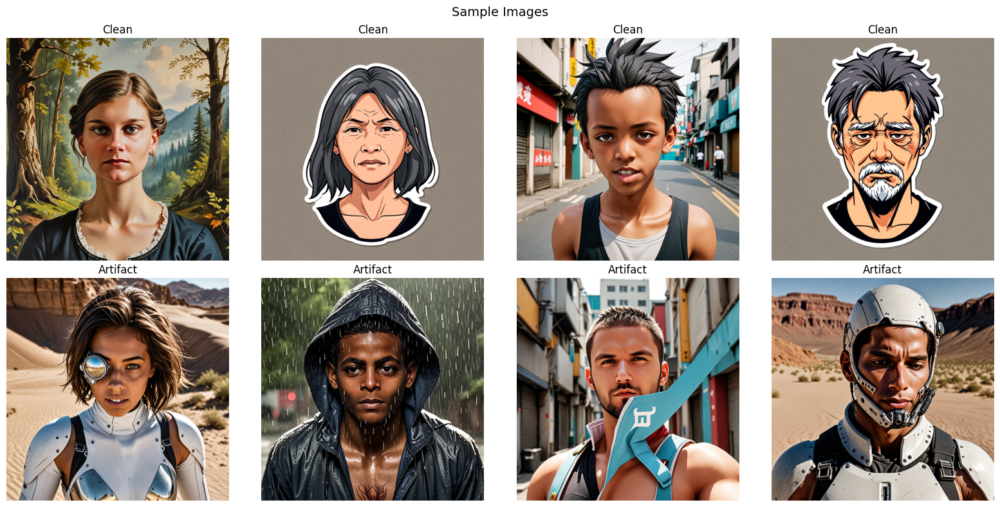

In [3]:
# Display sample images from each class
import cv2

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("Sample Images", fontsize=14)

clean_files = [f for f in test_files if f[1] == 1]
artifact_files = [f for f in test_files if f[1] == 0]

for i in range(4):
    # Clean
    img = cv2.imread(clean_files[i][0])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"Clean")
    axes[0, i].axis("off")

    # Artifact
    img = cv2.imread(artifact_files[i][0])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"Artifact")
    axes[1, i].axis("off")

plt.tight_layout()
plt.show()

## 3. Data Pipeline

In [4]:
dataloaders = get_ae_dataloaders(img_size=IMG_SIZE, batch_size=BATCH_SIZE)

print(f"Train batches: {len(dataloaders['train'])} (clean images only)")
print(f"Val batches: {len(dataloaders['val'])} (clean images only)")
print(f"Test batches: {len(dataloaders['test'])} (all images with labels)")

images, targets, paths = next(iter(dataloaders['train']))
print(f"\nBatch shape: {images.shape}")

Train batches: 87 (clean images only)
Val batches: 16 (clean images only)
Test batches: 13 (all images with labels)

Batch shape: torch.Size([16, 3, 256, 256])


## 4. Model Architecture

In [13]:
print(f"Input: {IMG_SIZE}x{IMG_SIZE}x3")

input_dim = IMG_SIZE * IMG_SIZE * 3
for b in BOTTLENECK_CHANNELS_LIST:
    model = ConvAutoencoder(b)
    latent_size = b * 16 * 16
    compression = input_dim / latent_size
    params = count_parameters(model)

model = ConvAutoencoder(DEFAULT_BOTTLENECK)


Input: 256x256x3


## 5. Train Default Autoencoder (Bottleneck=128)

In [14]:
set_seed(SEED)
model, history = train_autoencoder(
    bottleneck_channels=DEFAULT_BOTTLENECK,
    num_epochs=NUM_EPOCHS,
    device=device,
    dataloaders=dataloaders,
)

Bottleneck=128, Parameters=1,972,163


Epoch 1/100 | Train Loss: 0.036555 | Val Loss: 0.024907 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 0.021980 | Val Loss: 0.020717 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 0.017898 | Val Loss: 0.018663 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 0.015959 | Val Loss: 0.016134 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 0.014455 | Val Loss: 0.030631 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 0.013922 | Val Loss: 0.026247 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 0.013337 | Val Loss: 0.014960 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 0.012730 | Val Loss: 0.014270 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 0.011970 | Val Loss: 0.013894 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 0.011864 | Val Loss: 0.052569 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 0.012080 | Val Loss: 0.013836 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 0.010912 | Val Loss: 0.020343 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 0.010763 | Val Loss: 0.011311 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 0.010438 | Val Loss: 0.012667 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 0.010105 | Val Loss: 0.010616 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 0.010178 | Val Loss: 0.013993 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 0.010169 | Val Loss: 0.013276 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 0.009625 | Val Loss: 0.010975 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 0.009593 | Val Loss: 0.017251 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 0.009897 | Val Loss: 0.015315 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 0.009377 | Val Loss: 0.009838 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 0.009109 | Val Loss: 0.012424 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 0.009184 | Val Loss: 0.011028 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 0.009102 | Val Loss: 0.010884 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 0.008748 | Val Loss: 0.010212 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 0.008645 | Val Loss: 0.011745 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 0.008992 | Val Loss: 0.013762 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 0.008408 | Val Loss: 0.008614 | LR: 5.00e-04


Epoch 29/100 | Train Loss: 0.008205 | Val Loss: 0.008624 | LR: 5.00e-04


Epoch 30/100 | Train Loss: 0.008315 | Val Loss: 0.009377 | LR: 5.00e-04


Epoch 31/100 | Train Loss: 0.008107 | Val Loss: 0.009601 | LR: 5.00e-04


Epoch 32/100 | Train Loss: 0.008111 | Val Loss: 0.008479 | LR: 5.00e-04


Epoch 33/100 | Train Loss: 0.008095 | Val Loss: 0.010514 | LR: 5.00e-04


Epoch 34/100 | Train Loss: 0.008087 | Val Loss: 0.009224 | LR: 5.00e-04


Epoch 35/100 | Train Loss: 0.007940 | Val Loss: 0.010793 | LR: 5.00e-04


Epoch 36/100 | Train Loss: 0.007959 | Val Loss: 0.008705 | LR: 5.00e-04


Epoch 37/100 | Train Loss: 0.007856 | Val Loss: 0.008588 | LR: 5.00e-04


Epoch 38/100 | Train Loss: 0.007775 | Val Loss: 0.008525 | LR: 5.00e-04


Epoch 39/100 | Train Loss: 0.007670 | Val Loss: 0.008881 | LR: 2.50e-04


Epoch 40/100 | Train Loss: 0.007683 | Val Loss: 0.008281 | LR: 2.50e-04


Epoch 41/100 | Train Loss: 0.007676 | Val Loss: 0.007903 | LR: 2.50e-04


Epoch 42/100 | Train Loss: 0.007638 | Val Loss: 0.009485 | LR: 2.50e-04


Epoch 43/100 | Train Loss: 0.007548 | Val Loss: 0.008238 | LR: 2.50e-04


Epoch 44/100 | Train Loss: 0.007531 | Val Loss: 0.008393 | LR: 2.50e-04


Epoch 45/100 | Train Loss: 0.007497 | Val Loss: 0.008162 | LR: 2.50e-04


Epoch 46/100 | Train Loss: 0.007416 | Val Loss: 0.007738 | LR: 2.50e-04


Epoch 47/100 | Train Loss: 0.007441 | Val Loss: 0.008566 | LR: 2.50e-04


Epoch 48/100 | Train Loss: 0.007380 | Val Loss: 0.009510 | LR: 2.50e-04


Epoch 49/100 | Train Loss: 0.007531 | Val Loss: 0.008148 | LR: 2.50e-04


Epoch 50/100 | Train Loss: 0.007343 | Val Loss: 0.007612 | LR: 2.50e-04


Epoch 51/100 | Train Loss: 0.007320 | Val Loss: 0.007729 | LR: 2.50e-04


Epoch 52/100 | Train Loss: 0.007282 | Val Loss: 0.007855 | LR: 2.50e-04


Epoch 53/100 | Train Loss: 0.007296 | Val Loss: 0.009019 | LR: 2.50e-04


Epoch 54/100 | Train Loss: 0.007380 | Val Loss: 0.007620 | LR: 2.50e-04


Epoch 55/100 | Train Loss: 0.007202 | Val Loss: 0.007797 | LR: 2.50e-04


Epoch 56/100 | Train Loss: 0.007213 | Val Loss: 0.007554 | LR: 2.50e-04


Epoch 57/100 | Train Loss: 0.007258 | Val Loss: 0.008879 | LR: 2.50e-04


Epoch 58/100 | Train Loss: 0.007190 | Val Loss: 0.008003 | LR: 2.50e-04


Epoch 59/100 | Train Loss: 0.007129 | Val Loss: 0.007468 | LR: 2.50e-04


Epoch 60/100 | Train Loss: 0.007050 | Val Loss: 0.007815 | LR: 2.50e-04


Epoch 61/100 | Train Loss: 0.007067 | Val Loss: 0.007637 | LR: 2.50e-04


Epoch 62/100 | Train Loss: 0.007112 | Val Loss: 0.007425 | LR: 2.50e-04


Epoch 63/100 | Train Loss: 0.007091 | Val Loss: 0.007733 | LR: 2.50e-04


Epoch 64/100 | Train Loss: 0.007167 | Val Loss: 0.007993 | LR: 2.50e-04


Epoch 65/100 | Train Loss: 0.007004 | Val Loss: 0.007927 | LR: 2.50e-04


Epoch 66/100 | Train Loss: 0.006975 | Val Loss: 0.007432 | LR: 2.50e-04


Epoch 67/100 | Train Loss: 0.006934 | Val Loss: 0.007390 | LR: 2.50e-04


Epoch 68/100 | Train Loss: 0.006894 | Val Loss: 0.008015 | LR: 2.50e-04


Epoch 69/100 | Train Loss: 0.006875 | Val Loss: 0.008251 | LR: 2.50e-04


Epoch 70/100 | Train Loss: 0.006879 | Val Loss: 0.008122 | LR: 2.50e-04


Epoch 71/100 | Train Loss: 0.006855 | Val Loss: 0.007504 | LR: 2.50e-04


Epoch 72/100 | Train Loss: 0.006882 | Val Loss: 0.007361 | LR: 2.50e-04


Epoch 73/100 | Train Loss: 0.006842 | Val Loss: 0.008777 | LR: 2.50e-04


Epoch 74/100 | Train Loss: 0.006875 | Val Loss: 0.007582 | LR: 2.50e-04


Epoch 75/100 | Train Loss: 0.006783 | Val Loss: 0.007441 | LR: 2.50e-04


Epoch 76/100 | Train Loss: 0.006835 | Val Loss: 0.007276 | LR: 2.50e-04


Epoch 77/100 | Train Loss: 0.006694 | Val Loss: 0.007089 | LR: 2.50e-04


Epoch 78/100 | Train Loss: 0.006759 | Val Loss: 0.007138 | LR: 2.50e-04


Epoch 79/100 | Train Loss: 0.006645 | Val Loss: 0.007139 | LR: 2.50e-04


Epoch 80/100 | Train Loss: 0.006771 | Val Loss: 0.008764 | LR: 2.50e-04


Epoch 81/100 | Train Loss: 0.006854 | Val Loss: 0.007409 | LR: 2.50e-04


Epoch 82/100 | Train Loss: 0.006688 | Val Loss: 0.007686 | LR: 2.50e-04


Epoch 83/100 | Train Loss: 0.006685 | Val Loss: 0.007901 | LR: 2.50e-04


Epoch 84/100 | Train Loss: 0.006559 | Val Loss: 0.006896 | LR: 1.25e-04


Epoch 85/100 | Train Loss: 0.006535 | Val Loss: 0.006989 | LR: 1.25e-04


Epoch 86/100 | Train Loss: 0.006493 | Val Loss: 0.006974 | LR: 1.25e-04


Epoch 87/100 | Train Loss: 0.006533 | Val Loss: 0.006880 | LR: 1.25e-04


Epoch 88/100 | Train Loss: 0.006502 | Val Loss: 0.007224 | LR: 1.25e-04


Epoch 89/100 | Train Loss: 0.006528 | Val Loss: 0.006873 | LR: 1.25e-04


Epoch 90/100 | Train Loss: 0.006523 | Val Loss: 0.006904 | LR: 1.25e-04


Epoch 91/100 | Train Loss: 0.006490 | Val Loss: 0.007085 | LR: 1.25e-04


Epoch 92/100 | Train Loss: 0.006409 | Val Loss: 0.006824 | LR: 1.25e-04


Epoch 93/100 | Train Loss: 0.006496 | Val Loss: 0.007081 | LR: 1.25e-04


Epoch 94/100 | Train Loss: 0.006448 | Val Loss: 0.006852 | LR: 1.25e-04


Epoch 95/100 | Train Loss: 0.006464 | Val Loss: 0.006925 | LR: 1.25e-04


Epoch 96/100 | Train Loss: 0.006391 | Val Loss: 0.006887 | LR: 1.25e-04


Epoch 97/100 | Train Loss: 0.006422 | Val Loss: 0.006936 | LR: 1.25e-04


Epoch 98/100 | Train Loss: 0.006368 | Val Loss: 0.006775 | LR: 1.25e-04


Epoch 99/100 | Train Loss: 0.006383 | Val Loss: 0.007207 | LR: 1.25e-04


Epoch 100/100 | Train Loss: 0.006432 | Val Loss: 0.006770 | LR: 1.25e-04
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_128.pth


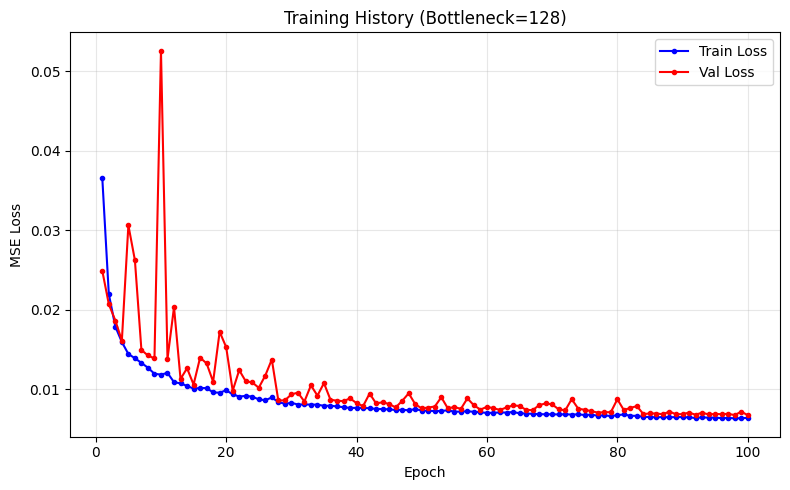

In [15]:
fig = plot_training_history(history, title=f"Training History (Bottleneck={DEFAULT_BOTTLENECK})")
fig.savefig(f"{PLOTS_DIR}/training_history_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

## 6. Reconstruction Visualization

In [16]:
# Compute reconstruction errors on test set
test_results = compute_reconstruction_errors(model, dataloaders['test'], device)

print(f"Test images: {len(test_results['errors'])}")
print(f"Clean mean error:    {test_results['errors'][test_results['labels'] == 1].mean():.6f}")
print(f"Artifact mean error: {test_results['errors'][test_results['labels'] == 0].mean():.6f}")

Computing errors: 100%|██████████| 13/13 [00:08<00:00,  1.56it/s]

Test images: 200
Clean mean error:    0.006394
Artifact mean error: 0.006164


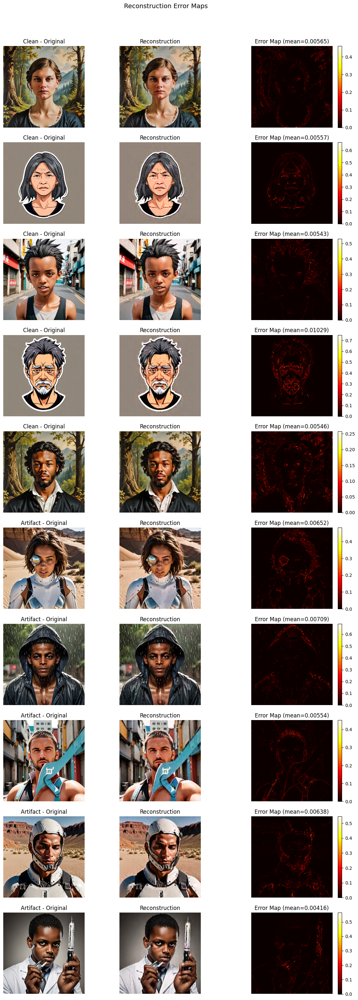

In [17]:
fig = plot_error_maps(
    test_results['originals'],
    test_results['reconstructions'],
    test_results['error_maps'],
    test_results['labels'],
    n_samples=5,
)
fig.savefig(f"{PLOTS_DIR}/error_maps_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

## 7. Anomaly Detection

In [18]:
val_results = compute_reconstruction_errors(model, dataloaders['val'], device)
clean_val_errors = val_results['errors']

threshold_95 = set_threshold_from_clean(clean_val_errors, percentile=95)
threshold_99 = set_threshold_from_clean(clean_val_errors, percentile=99)

oracle_threshold, oracle_f1 = optimize_threshold_on_test(
    test_results['errors'], test_results['labels']
)

print(f"Clean val error: mean={clean_val_errors.mean():.6f}, std={clean_val_errors.std():.6f}")
print(f"\nThreshold (95th percentile): {threshold_95:.6f}")
print(f"Threshold (99th percentile): {threshold_99:.6f}")
print(f"Threshold (oracle on test):  {oracle_threshold:.6f} (F1={oracle_f1:.4f})")

Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.45it/s]


Clean val error: mean=0.006775, std=0.001747

Threshold (95th percentile): 0.009658
Threshold (99th percentile): 0.011166
Threshold (oracle on test):  0.010314 (F1=0.5226)


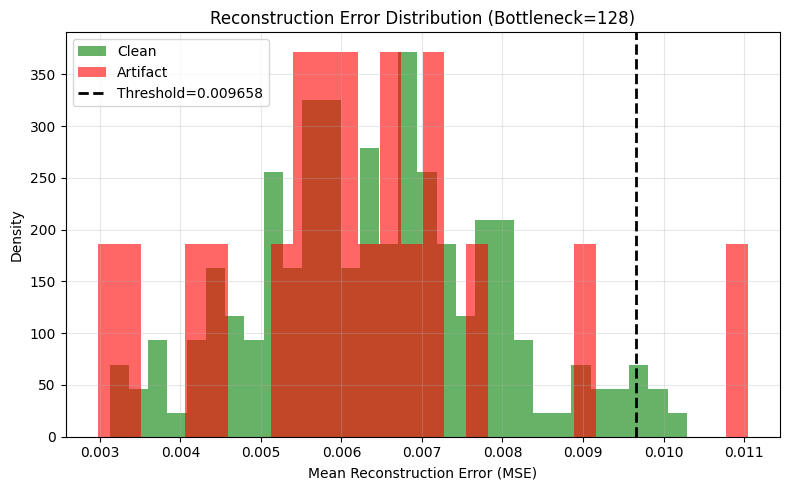

In [19]:
fig = plot_error_distribution(
    test_results['errors'],
    test_results['labels'],
    threshold=threshold_95,
    title=f"Reconstruction Error Distribution (Bottleneck={DEFAULT_BOTTLENECK})",
)
fig.savefig(f"{PLOTS_DIR}/error_distribution_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

## 8. Evaluation

In [20]:
# Evaluate at different thresholds
for name, threshold in [("95th pctl", threshold_95), ("99th pctl", threshold_99), ("Oracle", oracle_threshold)]:
    results = evaluate_anomaly_detection(
        test_results['errors'], test_results['labels'], threshold
    )
    print(f"\n{name} (threshold={threshold:.6f})")
    print(f"Macro F1:  {results['macro_f1']:.4f}")
    print(results['report'])


95th pctl (threshold=0.009658)
Macro F1:  0.5064
              precision    recall  f1-score   support

    artifact       0.17      0.05      0.08        20
       clean       0.90      0.97      0.94       180

    accuracy                           0.88       200
   macro avg       0.53      0.51      0.51       200
weighted avg       0.83      0.88      0.85       200


99th pctl (threshold=0.011166)
Macro F1:  0.4737
              precision    recall  f1-score   support

    artifact       0.00      0.00      0.00        20
       clean       0.90      1.00      0.95       180

    accuracy                           0.90       200
   macro avg       0.45      0.50      0.47       200
weighted avg       0.81      0.90      0.85       200


Oracle (threshold=0.010314)
Macro F1:  0.5226
              precision    recall  f1-score   support

    artifact       1.00      0.05      0.10        20
       clean       0.90      1.00      0.95       180

    accuracy                       

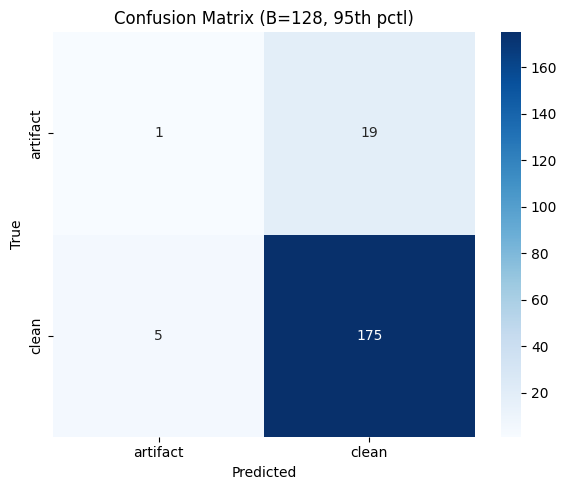

In [21]:
best_unsupervised = threshold_95
eval_results = evaluate_anomaly_detection(
    test_results['errors'], test_results['labels'], best_unsupervised
)

fig = plot_confusion_matrix(eval_results['confusion_matrix'],
                            title=f"Confusion Matrix (B={DEFAULT_BOTTLENECK}, 95th pctl)")
fig.savefig(f"{PLOTS_DIR}/confusion_matrix_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

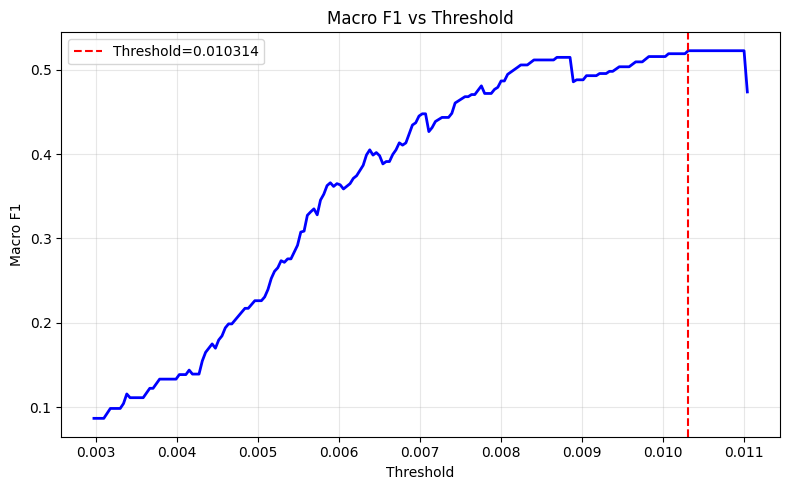

In [22]:
fig = plot_threshold_curve(
    test_results['errors'], test_results['labels'],
    best_threshold=oracle_threshold,
)
fig.savefig(f"{PLOTS_DIR}/threshold_curve_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

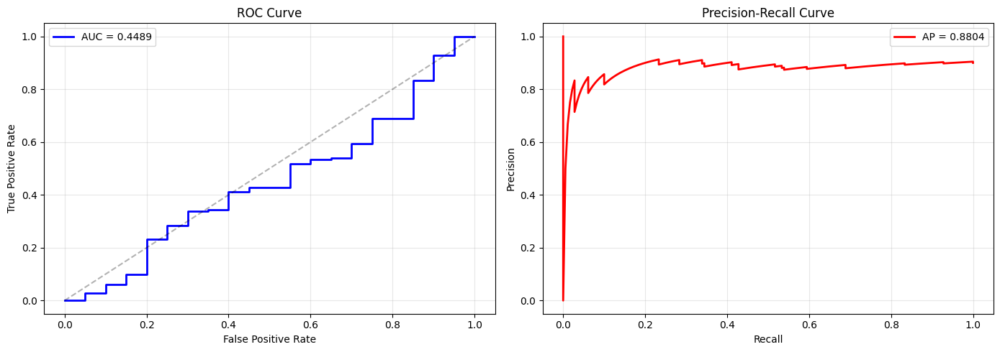

In [23]:
# ROC and Precision-Recall curves
fig = plot_roc_pr_curves(test_results['errors'], test_results['labels'])
fig.savefig(f"{PLOTS_DIR}/roc_pr_curves_b{DEFAULT_BOTTLENECK}.png", dpi=150, bbox_inches="tight")
plt.show()

## 9. Bottleneck Experiment

Train autoencoders with different bottleneck sizes to study how compression affects anomaly detection quality.

**Hypothesis:**
- **Small bottleneck (32):** Very tight compression. High reconstruction error for everything. Poor discrimination.
- **Medium bottleneck (64-128):** Good clean reconstruction, artifact patterns lost in bottleneck.
- **Large bottleneck (256-512):** Near-identity risk. May reconstruct artifacts too well, eliminating anomaly signal.

In [24]:
bottleneck_results = {}
bottleneck_models = {}
bottleneck_histories = {}

for b in BOTTLENECK_CHANNELS_LIST:
    print(f"Training Bottleneck={b}")

    set_seed(SEED)

    if b == DEFAULT_BOTTLENECK and model is not None:
        bottleneck_models[b] = model
        bottleneck_histories[b] = history
    else:
        m, h = train_autoencoder(
            bottleneck_channels=b,
            num_epochs=NUM_EPOCHS,
            device=device,
            dataloaders=dataloaders,
        )
        bottleneck_models[b] = m
        bottleneck_histories[b] = h

    # evaluate
    tr = compute_reconstruction_errors(bottleneck_models[b], dataloaders['test'], device)
    vr = compute_reconstruction_errors(bottleneck_models[b], dataloaders['val'], device)

    t = set_threshold_from_clean(vr['errors'], percentile=95)
    ev = evaluate_anomaly_detection(tr['errors'], tr['labels'], t)

    clean_mean = tr['errors'][tr['labels'] == 1].mean()
    artifact_mean = tr['errors'][tr['labels'] == 0].mean()

    bottleneck_results[b] = {
        'macro_f1': ev['macro_f1'],
        'clean_mean_error': clean_mean,
        'artifact_mean_error': artifact_mean,
        'threshold': t,
        'test_results': tr,
    }

    print(f"  Macro F1: {ev['macro_f1']:.4f}")
    print(f"  Clean error: {clean_mean:.6f} | Artifact error: {artifact_mean:.6f}")

Training Bottleneck=32
Bottleneck=32, Parameters=1,529,699


Epoch 1/100 | Train Loss: 0.038143 | Val Loss: 0.025552 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 0.022193 | Val Loss: 0.026347 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 0.018080 | Val Loss: 0.023053 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 0.016339 | Val Loss: 0.018084 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 0.014838 | Val Loss: 0.020166 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 0.013906 | Val Loss: 0.016148 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 0.013615 | Val Loss: 0.015448 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 0.013020 | Val Loss: 0.014580 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 0.012507 | Val Loss: 0.013883 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 0.012585 | Val Loss: 0.016268 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 0.012292 | Val Loss: 0.012862 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 0.011795 | Val Loss: 0.021972 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 0.012116 | Val Loss: 0.013026 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 0.011534 | Val Loss: 0.016638 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 0.011603 | Val Loss: 0.012855 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 0.011581 | Val Loss: 0.015119 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 0.011490 | Val Loss: 0.012299 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 0.010986 | Val Loss: 0.012330 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 0.010869 | Val Loss: 0.012141 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 0.011032 | Val Loss: 0.013384 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 0.011178 | Val Loss: 0.011357 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 0.010887 | Val Loss: 0.011987 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 0.010891 | Val Loss: 0.011447 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 0.010760 | Val Loss: 0.012069 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 0.010769 | Val Loss: 0.011477 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 0.010629 | Val Loss: 0.011363 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 0.010719 | Val Loss: 0.012726 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 0.010493 | Val Loss: 0.013639 | LR: 5.00e-04


Epoch 29/100 | Train Loss: 0.010512 | Val Loss: 0.013909 | LR: 5.00e-04


Epoch 30/100 | Train Loss: 0.010527 | Val Loss: 0.011007 | LR: 5.00e-04


Epoch 31/100 | Train Loss: 0.010201 | Val Loss: 0.011673 | LR: 5.00e-04


Epoch 32/100 | Train Loss: 0.010473 | Val Loss: 0.011265 | LR: 5.00e-04


Epoch 33/100 | Train Loss: 0.010204 | Val Loss: 0.011195 | LR: 5.00e-04


Epoch 34/100 | Train Loss: 0.010311 | Val Loss: 0.010780 | LR: 5.00e-04


Epoch 35/100 | Train Loss: 0.010352 | Val Loss: 0.010703 | LR: 5.00e-04


Epoch 36/100 | Train Loss: 0.010173 | Val Loss: 0.011647 | LR: 5.00e-04


Epoch 37/100 | Train Loss: 0.010214 | Val Loss: 0.011394 | LR: 5.00e-04


Epoch 38/100 | Train Loss: 0.010096 | Val Loss: 0.014757 | LR: 5.00e-04


Epoch 39/100 | Train Loss: 0.010275 | Val Loss: 0.010675 | LR: 5.00e-04


Epoch 40/100 | Train Loss: 0.009999 | Val Loss: 0.010554 | LR: 5.00e-04


Epoch 41/100 | Train Loss: 0.010040 | Val Loss: 0.010655 | LR: 5.00e-04


Epoch 42/100 | Train Loss: 0.010024 | Val Loss: 0.010722 | LR: 5.00e-04


Epoch 43/100 | Train Loss: 0.009973 | Val Loss: 0.011070 | LR: 5.00e-04


Epoch 44/100 | Train Loss: 0.010161 | Val Loss: 0.013430 | LR: 5.00e-04


Epoch 45/100 | Train Loss: 0.010046 | Val Loss: 0.010744 | LR: 5.00e-04


Epoch 46/100 | Train Loss: 0.009829 | Val Loss: 0.012323 | LR: 5.00e-04


Epoch 47/100 | Train Loss: 0.009806 | Val Loss: 0.010280 | LR: 2.50e-04


Epoch 48/100 | Train Loss: 0.009813 | Val Loss: 0.011000 | LR: 2.50e-04


Epoch 49/100 | Train Loss: 0.009686 | Val Loss: 0.010325 | LR: 2.50e-04


Epoch 50/100 | Train Loss: 0.009738 | Val Loss: 0.010625 | LR: 2.50e-04


Epoch 51/100 | Train Loss: 0.009651 | Val Loss: 0.010617 | LR: 2.50e-04


Epoch 52/100 | Train Loss: 0.009783 | Val Loss: 0.010255 | LR: 2.50e-04


Epoch 53/100 | Train Loss: 0.009729 | Val Loss: 0.010318 | LR: 2.50e-04


Epoch 54/100 | Train Loss: 0.009661 | Val Loss: 0.010703 | LR: 2.50e-04


Epoch 55/100 | Train Loss: 0.009634 | Val Loss: 0.010929 | LR: 2.50e-04


Epoch 56/100 | Train Loss: 0.009709 | Val Loss: 0.010730 | LR: 2.50e-04


Epoch 57/100 | Train Loss: 0.009550 | Val Loss: 0.011136 | LR: 2.50e-04


Epoch 58/100 | Train Loss: 0.009615 | Val Loss: 0.010474 | LR: 2.50e-04


Epoch 59/100 | Train Loss: 0.009509 | Val Loss: 0.010495 | LR: 1.25e-04


Epoch 60/100 | Train Loss: 0.009489 | Val Loss: 0.010129 | LR: 1.25e-04


Epoch 61/100 | Train Loss: 0.009474 | Val Loss: 0.010452 | LR: 1.25e-04


Epoch 62/100 | Train Loss: 0.009412 | Val Loss: 0.010007 | LR: 1.25e-04


Epoch 63/100 | Train Loss: 0.009434 | Val Loss: 0.010194 | LR: 1.25e-04


Epoch 64/100 | Train Loss: 0.009403 | Val Loss: 0.009976 | LR: 1.25e-04


Epoch 65/100 | Train Loss: 0.009384 | Val Loss: 0.010455 | LR: 1.25e-04


Epoch 66/100 | Train Loss: 0.009422 | Val Loss: 0.010540 | LR: 1.25e-04


Epoch 67/100 | Train Loss: 0.009417 | Val Loss: 0.009965 | LR: 1.25e-04


Epoch 68/100 | Train Loss: 0.009404 | Val Loss: 0.010778 | LR: 1.25e-04


Epoch 69/100 | Train Loss: 0.009386 | Val Loss: 0.010186 | LR: 1.25e-04


Epoch 70/100 | Train Loss: 0.009382 | Val Loss: 0.009941 | LR: 1.25e-04


Epoch 71/100 | Train Loss: 0.009315 | Val Loss: 0.009875 | LR: 1.25e-04


Epoch 72/100 | Train Loss: 0.009372 | Val Loss: 0.010534 | LR: 1.25e-04


Epoch 73/100 | Train Loss: 0.009329 | Val Loss: 0.009974 | LR: 1.25e-04


Epoch 74/100 | Train Loss: 0.009306 | Val Loss: 0.009885 | LR: 1.25e-04


Epoch 75/100 | Train Loss: 0.009300 | Val Loss: 0.009884 | LR: 1.25e-04


Epoch 76/100 | Train Loss: 0.009281 | Val Loss: 0.009928 | LR: 1.25e-04


Epoch 77/100 | Train Loss: 0.009325 | Val Loss: 0.010032 | LR: 1.25e-04


Epoch 78/100 | Train Loss: 0.009219 | Val Loss: 0.009946 | LR: 6.25e-05


Epoch 79/100 | Train Loss: 0.009219 | Val Loss: 0.009873 | LR: 6.25e-05


Epoch 80/100 | Train Loss: 0.009217 | Val Loss: 0.010214 | LR: 6.25e-05


Epoch 81/100 | Train Loss: 0.009220 | Val Loss: 0.009996 | LR: 6.25e-05
Early stopping at epoch 81
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_32.pth


Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]


  Macro F1: 0.5124
  Clean error: 0.009273 | Artifact error: 0.009488
Training Bottleneck=64
Bottleneck=64, Parameters=1,677,187


Epoch 1/100 | Train Loss: 0.034607 | Val Loss: 0.028463 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 0.021956 | Val Loss: 0.025527 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 0.018485 | Val Loss: 0.018031 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 0.016138 | Val Loss: 0.019497 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 0.015018 | Val Loss: 0.017132 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 0.014320 | Val Loss: 0.014685 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 0.013372 | Val Loss: 0.022447 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 0.013037 | Val Loss: 0.013654 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 0.012313 | Val Loss: 0.014005 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 0.011772 | Val Loss: 0.022627 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 0.011532 | Val Loss: 0.029009 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 0.011495 | Val Loss: 0.012022 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 0.010823 | Val Loss: 0.012748 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 0.010525 | Val Loss: 0.012609 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 0.010094 | Val Loss: 0.012445 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 0.010339 | Val Loss: 0.010861 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 0.010014 | Val Loss: 0.010524 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 0.009736 | Val Loss: 0.010507 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 0.009613 | Val Loss: 0.017519 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 0.009370 | Val Loss: 0.026850 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 0.009799 | Val Loss: 0.014406 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 0.009898 | Val Loss: 0.009876 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 0.009055 | Val Loss: 0.028229 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 0.009626 | Val Loss: 0.010082 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 0.009029 | Val Loss: 0.013698 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 0.008943 | Val Loss: 0.009706 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 0.008720 | Val Loss: 0.009326 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 0.008685 | Val Loss: 0.014183 | LR: 1.00e-03


Epoch 29/100 | Train Loss: 0.008914 | Val Loss: 0.009591 | LR: 1.00e-03


Epoch 30/100 | Train Loss: 0.008434 | Val Loss: 0.012771 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.008667 | Val Loss: 0.012391 | LR: 1.00e-03


Epoch 32/100 | Train Loss: 0.008537 | Val Loss: 0.015524 | LR: 1.00e-03


Epoch 33/100 | Train Loss: 0.008626 | Val Loss: 0.012991 | LR: 1.00e-03


Epoch 34/100 | Train Loss: 0.008224 | Val Loss: 0.008950 | LR: 5.00e-04


Epoch 35/100 | Train Loss: 0.008099 | Val Loss: 0.010176 | LR: 5.00e-04


Epoch 36/100 | Train Loss: 0.007991 | Val Loss: 0.010365 | LR: 5.00e-04


Epoch 37/100 | Train Loss: 0.008127 | Val Loss: 0.008975 | LR: 5.00e-04


Epoch 38/100 | Train Loss: 0.007992 | Val Loss: 0.008502 | LR: 5.00e-04


Epoch 39/100 | Train Loss: 0.007842 | Val Loss: 0.009123 | LR: 5.00e-04


Epoch 40/100 | Train Loss: 0.007921 | Val Loss: 0.008328 | LR: 5.00e-04


Epoch 41/100 | Train Loss: 0.007762 | Val Loss: 0.009379 | LR: 5.00e-04


Epoch 42/100 | Train Loss: 0.008010 | Val Loss: 0.008584 | LR: 5.00e-04


Epoch 43/100 | Train Loss: 0.007900 | Val Loss: 0.008192 | LR: 5.00e-04


Epoch 44/100 | Train Loss: 0.007830 | Val Loss: 0.010515 | LR: 5.00e-04


Epoch 45/100 | Train Loss: 0.007815 | Val Loss: 0.008205 | LR: 5.00e-04


Epoch 46/100 | Train Loss: 0.007620 | Val Loss: 0.008861 | LR: 5.00e-04


Epoch 47/100 | Train Loss: 0.007836 | Val Loss: 0.010515 | LR: 5.00e-04


Epoch 48/100 | Train Loss: 0.007716 | Val Loss: 0.008485 | LR: 5.00e-04


Epoch 49/100 | Train Loss: 0.007650 | Val Loss: 0.009881 | LR: 5.00e-04


Epoch 50/100 | Train Loss: 0.007493 | Val Loss: 0.008083 | LR: 2.50e-04


Epoch 51/100 | Train Loss: 0.007499 | Val Loss: 0.008015 | LR: 2.50e-04


Epoch 52/100 | Train Loss: 0.007431 | Val Loss: 0.008313 | LR: 2.50e-04


Epoch 53/100 | Train Loss: 0.007458 | Val Loss: 0.007907 | LR: 2.50e-04


Epoch 54/100 | Train Loss: 0.007483 | Val Loss: 0.007787 | LR: 2.50e-04


Epoch 55/100 | Train Loss: 0.007431 | Val Loss: 0.007895 | LR: 2.50e-04


Epoch 56/100 | Train Loss: 0.007427 | Val Loss: 0.007867 | LR: 2.50e-04


Epoch 57/100 | Train Loss: 0.007362 | Val Loss: 0.007883 | LR: 2.50e-04


Epoch 58/100 | Train Loss: 0.007512 | Val Loss: 0.007804 | LR: 2.50e-04


Epoch 59/100 | Train Loss: 0.007324 | Val Loss: 0.008433 | LR: 2.50e-04


Epoch 60/100 | Train Loss: 0.007380 | Val Loss: 0.008225 | LR: 2.50e-04


Epoch 61/100 | Train Loss: 0.007301 | Val Loss: 0.008266 | LR: 1.25e-04


Epoch 62/100 | Train Loss: 0.007359 | Val Loss: 0.008000 | LR: 1.25e-04


Epoch 63/100 | Train Loss: 0.007342 | Val Loss: 0.007766 | LR: 1.25e-04


Epoch 64/100 | Train Loss: 0.007261 | Val Loss: 0.007703 | LR: 1.25e-04


Epoch 65/100 | Train Loss: 0.007240 | Val Loss: 0.007637 | LR: 1.25e-04


Epoch 66/100 | Train Loss: 0.007246 | Val Loss: 0.007614 | LR: 1.25e-04


Epoch 67/100 | Train Loss: 0.007229 | Val Loss: 0.007904 | LR: 1.25e-04


Epoch 68/100 | Train Loss: 0.007206 | Val Loss: 0.007657 | LR: 1.25e-04


Epoch 69/100 | Train Loss: 0.007222 | Val Loss: 0.007629 | LR: 1.25e-04


Epoch 70/100 | Train Loss: 0.007211 | Val Loss: 0.007604 | LR: 1.25e-04


Epoch 71/100 | Train Loss: 0.007180 | Val Loss: 0.007584 | LR: 1.25e-04


Epoch 72/100 | Train Loss: 0.007193 | Val Loss: 0.007575 | LR: 1.25e-04


Epoch 73/100 | Train Loss: 0.007137 | Val Loss: 0.007691 | LR: 1.25e-04


Epoch 74/100 | Train Loss: 0.007166 | Val Loss: 0.007651 | LR: 1.25e-04


Epoch 75/100 | Train Loss: 0.007167 | Val Loss: 0.007628 | LR: 1.25e-04


Epoch 76/100 | Train Loss: 0.007175 | Val Loss: 0.007698 | LR: 1.25e-04


Epoch 77/100 | Train Loss: 0.007111 | Val Loss: 0.007589 | LR: 1.25e-04


Epoch 78/100 | Train Loss: 0.007153 | Val Loss: 0.007633 | LR: 1.25e-04


Epoch 79/100 | Train Loss: 0.007128 | Val Loss: 0.007626 | LR: 6.25e-05


Epoch 80/100 | Train Loss: 0.007077 | Val Loss: 0.007579 | LR: 6.25e-05


Epoch 81/100 | Train Loss: 0.007065 | Val Loss: 0.007771 | LR: 6.25e-05
Early stopping at epoch 81
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_64.pth


Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]


  Macro F1: 0.5124
  Clean error: 0.007138 | Artifact error: 0.006994
Training Bottleneck=128


Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]


  Macro F1: 0.5064
  Clean error: 0.006394 | Artifact error: 0.006164
Training Bottleneck=256
Bottleneck=256, Parameters=2,562,115


Epoch 1/100 | Train Loss: 0.032558 | Val Loss: 0.031211 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 0.020581 | Val Loss: 0.020422 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 0.017383 | Val Loss: 0.017855 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 0.015673 | Val Loss: 0.022385 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 0.014829 | Val Loss: 0.014241 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 0.013291 | Val Loss: 0.014745 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 0.012963 | Val Loss: 0.013703 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 0.012146 | Val Loss: 0.013185 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 0.011852 | Val Loss: 0.014170 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 0.011281 | Val Loss: 0.024968 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 0.011886 | Val Loss: 0.012575 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 0.010638 | Val Loss: 0.013129 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 0.010438 | Val Loss: 0.012655 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 0.009994 | Val Loss: 0.011930 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 0.009843 | Val Loss: 0.010274 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 0.009652 | Val Loss: 0.014026 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 0.009902 | Val Loss: 0.009978 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 0.009490 | Val Loss: 0.010380 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 0.009211 | Val Loss: 0.013471 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 0.009150 | Val Loss: 0.009433 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 0.008952 | Val Loss: 0.013698 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 0.008904 | Val Loss: 0.012445 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 0.008852 | Val Loss: 0.009330 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 0.008732 | Val Loss: 0.025319 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 0.008668 | Val Loss: 0.010821 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 0.008436 | Val Loss: 0.009302 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 0.008297 | Val Loss: 0.008959 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 0.008026 | Val Loss: 0.019284 | LR: 1.00e-03


Epoch 29/100 | Train Loss: 0.008516 | Val Loss: 0.012922 | LR: 1.00e-03


Epoch 30/100 | Train Loss: 0.008193 | Val Loss: 0.008717 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.007693 | Val Loss: 0.009331 | LR: 1.00e-03


Epoch 32/100 | Train Loss: 0.007878 | Val Loss: 0.008155 | LR: 1.00e-03


Epoch 33/100 | Train Loss: 0.007811 | Val Loss: 0.009280 | LR: 1.00e-03


Epoch 34/100 | Train Loss: 0.007472 | Val Loss: 0.009492 | LR: 1.00e-03


Epoch 35/100 | Train Loss: 0.007493 | Val Loss: 0.011840 | LR: 1.00e-03


Epoch 36/100 | Train Loss: 0.007531 | Val Loss: 0.007851 | LR: 1.00e-03


Epoch 37/100 | Train Loss: 0.007411 | Val Loss: 0.008075 | LR: 1.00e-03


Epoch 38/100 | Train Loss: 0.007274 | Val Loss: 0.007814 | LR: 1.00e-03


Epoch 39/100 | Train Loss: 0.007227 | Val Loss: 0.008271 | LR: 1.00e-03


Epoch 40/100 | Train Loss: 0.007385 | Val Loss: 0.013947 | LR: 1.00e-03


Epoch 41/100 | Train Loss: 0.007255 | Val Loss: 0.008603 | LR: 1.00e-03


Epoch 42/100 | Train Loss: 0.007181 | Val Loss: 0.007666 | LR: 1.00e-03


Epoch 43/100 | Train Loss: 0.006990 | Val Loss: 0.008381 | LR: 1.00e-03


Epoch 44/100 | Train Loss: 0.006864 | Val Loss: 0.008097 | LR: 1.00e-03


Epoch 45/100 | Train Loss: 0.006823 | Val Loss: 0.011214 | LR: 1.00e-03


Epoch 46/100 | Train Loss: 0.006943 | Val Loss: 0.007214 | LR: 1.00e-03


Epoch 47/100 | Train Loss: 0.006641 | Val Loss: 0.018021 | LR: 1.00e-03


Epoch 48/100 | Train Loss: 0.007345 | Val Loss: 0.009784 | LR: 1.00e-03


Epoch 49/100 | Train Loss: 0.006817 | Val Loss: 0.009870 | LR: 1.00e-03


Epoch 50/100 | Train Loss: 0.006583 | Val Loss: 0.009254 | LR: 1.00e-03


Epoch 51/100 | Train Loss: 0.006645 | Val Loss: 0.007877 | LR: 1.00e-03


Epoch 52/100 | Train Loss: 0.006635 | Val Loss: 0.007141 | LR: 1.00e-03


Epoch 53/100 | Train Loss: 0.006370 | Val Loss: 0.008009 | LR: 1.00e-03


Epoch 54/100 | Train Loss: 0.006316 | Val Loss: 0.006973 | LR: 1.00e-03


Epoch 55/100 | Train Loss: 0.006464 | Val Loss: 0.012977 | LR: 1.00e-03


Epoch 56/100 | Train Loss: 0.006516 | Val Loss: 0.007163 | LR: 1.00e-03


Epoch 57/100 | Train Loss: 0.006290 | Val Loss: 0.008304 | LR: 1.00e-03


Epoch 58/100 | Train Loss: 0.006194 | Val Loss: 0.007038 | LR: 1.00e-03


Epoch 59/100 | Train Loss: 0.006175 | Val Loss: 0.006927 | LR: 1.00e-03


Epoch 60/100 | Train Loss: 0.006167 | Val Loss: 0.008029 | LR: 1.00e-03


Epoch 61/100 | Train Loss: 0.006059 | Val Loss: 0.007034 | LR: 1.00e-03


Epoch 62/100 | Train Loss: 0.006047 | Val Loss: 0.006886 | LR: 1.00e-03


Epoch 63/100 | Train Loss: 0.006042 | Val Loss: 0.007180 | LR: 1.00e-03


Epoch 64/100 | Train Loss: 0.005939 | Val Loss: 0.006780 | LR: 1.00e-03


Epoch 65/100 | Train Loss: 0.006070 | Val Loss: 0.007818 | LR: 1.00e-03


Epoch 66/100 | Train Loss: 0.005824 | Val Loss: 0.007272 | LR: 1.00e-03


Epoch 67/100 | Train Loss: 0.005963 | Val Loss: 0.007234 | LR: 1.00e-03


Epoch 68/100 | Train Loss: 0.005855 | Val Loss: 0.008007 | LR: 1.00e-03


Epoch 69/100 | Train Loss: 0.005959 | Val Loss: 0.033701 | LR: 1.00e-03


Epoch 70/100 | Train Loss: 0.007090 | Val Loss: 0.007950 | LR: 1.00e-03


Epoch 71/100 | Train Loss: 0.006040 | Val Loss: 0.006856 | LR: 5.00e-04


Epoch 72/100 | Train Loss: 0.005836 | Val Loss: 0.006135 | LR: 5.00e-04


Epoch 73/100 | Train Loss: 0.005731 | Val Loss: 0.006014 | LR: 5.00e-04


Epoch 74/100 | Train Loss: 0.005678 | Val Loss: 0.006033 | LR: 5.00e-04


Epoch 75/100 | Train Loss: 0.005572 | Val Loss: 0.006581 | LR: 5.00e-04


Epoch 76/100 | Train Loss: 0.005731 | Val Loss: 0.006050 | LR: 5.00e-04


Epoch 77/100 | Train Loss: 0.005639 | Val Loss: 0.006016 | LR: 5.00e-04


Epoch 78/100 | Train Loss: 0.005568 | Val Loss: 0.006037 | LR: 5.00e-04


Epoch 79/100 | Train Loss: 0.005552 | Val Loss: 0.006649 | LR: 5.00e-04


Epoch 80/100 | Train Loss: 0.005554 | Val Loss: 0.005693 | LR: 2.50e-04


Epoch 81/100 | Train Loss: 0.005418 | Val Loss: 0.005702 | LR: 2.50e-04


Epoch 82/100 | Train Loss: 0.005407 | Val Loss: 0.005903 | LR: 2.50e-04


Epoch 83/100 | Train Loss: 0.005406 | Val Loss: 0.005755 | LR: 2.50e-04


Epoch 84/100 | Train Loss: 0.005402 | Val Loss: 0.005906 | LR: 2.50e-04


Epoch 85/100 | Train Loss: 0.005445 | Val Loss: 0.005679 | LR: 2.50e-04


Epoch 86/100 | Train Loss: 0.005371 | Val Loss: 0.005854 | LR: 2.50e-04


Epoch 87/100 | Train Loss: 0.005377 | Val Loss: 0.005895 | LR: 2.50e-04


Epoch 88/100 | Train Loss: 0.005364 | Val Loss: 0.005636 | LR: 2.50e-04


Epoch 89/100 | Train Loss: 0.005303 | Val Loss: 0.005829 | LR: 2.50e-04


Epoch 90/100 | Train Loss: 0.005366 | Val Loss: 0.006336 | LR: 2.50e-04


Epoch 91/100 | Train Loss: 0.005359 | Val Loss: 0.005691 | LR: 2.50e-04


Epoch 92/100 | Train Loss: 0.005358 | Val Loss: 0.005644 | LR: 2.50e-04


Epoch 93/100 | Train Loss: 0.005312 | Val Loss: 0.005626 | LR: 2.50e-04


Epoch 94/100 | Train Loss: 0.005247 | Val Loss: 0.005564 | LR: 2.50e-04


Epoch 95/100 | Train Loss: 0.005278 | Val Loss: 0.005580 | LR: 2.50e-04


Epoch 96/100 | Train Loss: 0.005267 | Val Loss: 0.005745 | LR: 2.50e-04


Epoch 97/100 | Train Loss: 0.005278 | Val Loss: 0.005849 | LR: 2.50e-04


Epoch 98/100 | Train Loss: 0.005347 | Val Loss: 0.005573 | LR: 2.50e-04


Epoch 99/100 | Train Loss: 0.005236 | Val Loss: 0.007288 | LR: 2.50e-04


Epoch 100/100 | Train Loss: 0.005343 | Val Loss: 0.005779 | LR: 2.50e-04
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_256.pth


Computing errors: 100%|██████████| 16/16 [00:05<00:00,  2.78it/s]


  Macro F1: 0.4981
  Clean error: 0.005258 | Artifact error: 0.005023
Training Bottleneck=512
Bottleneck=512, Parameters=3,742,019


Epoch 1/100 | Train Loss: 0.034748 | Val Loss: 0.024964 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 0.021639 | Val Loss: 0.024025 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 0.017795 | Val Loss: 0.024541 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 0.016334 | Val Loss: 0.022388 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 0.015463 | Val Loss: 0.015817 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 0.013931 | Val Loss: 0.013983 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 0.013454 | Val Loss: 0.014607 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 0.012855 | Val Loss: 0.017530 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 0.012497 | Val Loss: 0.016032 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 0.012058 | Val Loss: 0.014101 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 0.011363 | Val Loss: 0.016913 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 0.011317 | Val Loss: 0.012232 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 0.010713 | Val Loss: 0.013243 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 0.010428 | Val Loss: 0.011106 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 0.010397 | Val Loss: 0.012391 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 0.009758 | Val Loss: 0.018730 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 0.009794 | Val Loss: 0.010681 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 0.009577 | Val Loss: 0.009895 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 0.009483 | Val Loss: 0.010468 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 0.009400 | Val Loss: 0.014423 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 0.009256 | Val Loss: 0.009441 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 0.008925 | Val Loss: 0.011471 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 0.008936 | Val Loss: 0.009353 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 0.008715 | Val Loss: 0.009987 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 0.008720 | Val Loss: 0.009444 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 0.008499 | Val Loss: 0.010771 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 0.008454 | Val Loss: 0.009733 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 0.008252 | Val Loss: 0.008959 | LR: 1.00e-03


Epoch 29/100 | Train Loss: 0.008209 | Val Loss: 0.010559 | LR: 1.00e-03


Epoch 30/100 | Train Loss: 0.008166 | Val Loss: 0.009231 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.007947 | Val Loss: 0.009296 | LR: 1.00e-03


Epoch 32/100 | Train Loss: 0.007816 | Val Loss: 0.016860 | LR: 1.00e-03


Epoch 33/100 | Train Loss: 0.008503 | Val Loss: 0.009305 | LR: 1.00e-03


Epoch 34/100 | Train Loss: 0.007746 | Val Loss: 0.010216 | LR: 1.00e-03


Epoch 35/100 | Train Loss: 0.007484 | Val Loss: 0.008284 | LR: 5.00e-04


Epoch 36/100 | Train Loss: 0.007510 | Val Loss: 0.008199 | LR: 5.00e-04


Epoch 37/100 | Train Loss: 0.007370 | Val Loss: 0.007945 | LR: 5.00e-04


Epoch 38/100 | Train Loss: 0.007387 | Val Loss: 0.007922 | LR: 5.00e-04


Epoch 39/100 | Train Loss: 0.007322 | Val Loss: 0.007860 | LR: 5.00e-04


Epoch 40/100 | Train Loss: 0.007320 | Val Loss: 0.008573 | LR: 5.00e-04


Epoch 41/100 | Train Loss: 0.007361 | Val Loss: 0.009385 | LR: 5.00e-04


Epoch 42/100 | Train Loss: 0.007214 | Val Loss: 0.008092 | LR: 5.00e-04


Epoch 43/100 | Train Loss: 0.007185 | Val Loss: 0.007691 | LR: 5.00e-04


Epoch 44/100 | Train Loss: 0.007123 | Val Loss: 0.007718 | LR: 5.00e-04


Epoch 45/100 | Train Loss: 0.007016 | Val Loss: 0.007555 | LR: 5.00e-04


Epoch 46/100 | Train Loss: 0.006932 | Val Loss: 0.007494 | LR: 5.00e-04


Epoch 47/100 | Train Loss: 0.006879 | Val Loss: 0.007321 | LR: 5.00e-04


Epoch 48/100 | Train Loss: 0.006893 | Val Loss: 0.007237 | LR: 5.00e-04


Epoch 49/100 | Train Loss: 0.006784 | Val Loss: 0.007214 | LR: 5.00e-04


Epoch 50/100 | Train Loss: 0.006735 | Val Loss: 0.007869 | LR: 5.00e-04


Epoch 51/100 | Train Loss: 0.006858 | Val Loss: 0.010934 | LR: 5.00e-04


Epoch 52/100 | Train Loss: 0.006942 | Val Loss: 0.007386 | LR: 5.00e-04


Epoch 53/100 | Train Loss: 0.006659 | Val Loss: 0.007722 | LR: 5.00e-04


Epoch 54/100 | Train Loss: 0.006809 | Val Loss: 0.007446 | LR: 5.00e-04


Epoch 55/100 | Train Loss: 0.006628 | Val Loss: 0.007297 | LR: 5.00e-04


Epoch 56/100 | Train Loss: 0.006574 | Val Loss: 0.008178 | LR: 2.50e-04


Epoch 57/100 | Train Loss: 0.006467 | Val Loss: 0.007302 | LR: 2.50e-04


Epoch 58/100 | Train Loss: 0.006519 | Val Loss: 0.007046 | LR: 2.50e-04


Epoch 59/100 | Train Loss: 0.006472 | Val Loss: 0.006911 | LR: 2.50e-04


Epoch 60/100 | Train Loss: 0.006449 | Val Loss: 0.007267 | LR: 2.50e-04


Epoch 61/100 | Train Loss: 0.006412 | Val Loss: 0.006735 | LR: 2.50e-04


Epoch 62/100 | Train Loss: 0.006354 | Val Loss: 0.006964 | LR: 2.50e-04


Epoch 63/100 | Train Loss: 0.006346 | Val Loss: 0.006706 | LR: 2.50e-04


Epoch 64/100 | Train Loss: 0.006301 | Val Loss: 0.006709 | LR: 2.50e-04


Epoch 65/100 | Train Loss: 0.006298 | Val Loss: 0.006829 | LR: 2.50e-04


Epoch 66/100 | Train Loss: 0.006269 | Val Loss: 0.006599 | LR: 2.50e-04


Epoch 67/100 | Train Loss: 0.006201 | Val Loss: 0.006567 | LR: 2.50e-04


Epoch 68/100 | Train Loss: 0.006176 | Val Loss: 0.006912 | LR: 2.50e-04


Epoch 69/100 | Train Loss: 0.006198 | Val Loss: 0.006659 | LR: 2.50e-04


Epoch 70/100 | Train Loss: 0.006252 | Val Loss: 0.006736 | LR: 2.50e-04


Epoch 71/100 | Train Loss: 0.006145 | Val Loss: 0.006614 | LR: 2.50e-04


Epoch 72/100 | Train Loss: 0.006148 | Val Loss: 0.006703 | LR: 2.50e-04


Epoch 73/100 | Train Loss: 0.006119 | Val Loss: 0.006779 | LR: 2.50e-04


Epoch 74/100 | Train Loss: 0.006081 | Val Loss: 0.006395 | LR: 1.25e-04


Epoch 75/100 | Train Loss: 0.006045 | Val Loss: 0.006376 | LR: 1.25e-04


Epoch 76/100 | Train Loss: 0.006025 | Val Loss: 0.006536 | LR: 1.25e-04


Epoch 77/100 | Train Loss: 0.005981 | Val Loss: 0.006393 | LR: 1.25e-04


Epoch 78/100 | Train Loss: 0.006026 | Val Loss: 0.006372 | LR: 1.25e-04


Epoch 79/100 | Train Loss: 0.006023 | Val Loss: 0.006358 | LR: 1.25e-04


Epoch 80/100 | Train Loss: 0.005992 | Val Loss: 0.006691 | LR: 1.25e-04


Epoch 81/100 | Train Loss: 0.005994 | Val Loss: 0.006767 | LR: 1.25e-04


Epoch 82/100 | Train Loss: 0.006053 | Val Loss: 0.006334 | LR: 1.25e-04


Epoch 83/100 | Train Loss: 0.005958 | Val Loss: 0.006469 | LR: 1.25e-04


Epoch 84/100 | Train Loss: 0.006054 | Val Loss: 0.006373 | LR: 1.25e-04


Epoch 85/100 | Train Loss: 0.005966 | Val Loss: 0.006289 | LR: 1.25e-04


Epoch 86/100 | Train Loss: 0.005965 | Val Loss: 0.006415 | LR: 1.25e-04


Epoch 87/100 | Train Loss: 0.005920 | Val Loss: 0.006373 | LR: 1.25e-04


Epoch 88/100 | Train Loss: 0.005927 | Val Loss: 0.007109 | LR: 1.25e-04


Epoch 89/100 | Train Loss: 0.005955 | Val Loss: 0.006336 | LR: 1.25e-04


Epoch 90/100 | Train Loss: 0.005902 | Val Loss: 0.006261 | LR: 1.25e-04


Epoch 91/100 | Train Loss: 0.005878 | Val Loss: 0.006302 | LR: 1.25e-04


Epoch 92/100 | Train Loss: 0.005870 | Val Loss: 0.006252 | LR: 1.25e-04


Epoch 93/100 | Train Loss: 0.005849 | Val Loss: 0.006212 | LR: 1.25e-04


Epoch 94/100 | Train Loss: 0.005868 | Val Loss: 0.006276 | LR: 1.25e-04


Epoch 95/100 | Train Loss: 0.005867 | Val Loss: 0.006252 | LR: 1.25e-04


Epoch 96/100 | Train Loss: 0.005914 | Val Loss: 0.006293 | LR: 1.25e-04


Epoch 97/100 | Train Loss: 0.005863 | Val Loss: 0.006268 | LR: 1.25e-04


Epoch 98/100 | Train Loss: 0.005867 | Val Loss: 0.006309 | LR: 1.25e-04


Epoch 99/100 | Train Loss: 0.005813 | Val Loss: 0.006702 | LR: 1.25e-04


Epoch 100/100 | Train Loss: 0.005806 | Val Loss: 0.006239 | LR: 6.25e-05
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_512.pth


Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s]

  Macro F1: 0.5008
  Clean error: 0.005859 | Artifact error: 0.005650


In [25]:
import pandas as pd

summary_rows = []
for b in BOTTLENECK_CHANNELS_LIST:
    r = bottleneck_results[b]
    summary_rows.append({
        'Bottleneck': b,
        'Latent Dim': f"{b}x16x16={b*256}",
        'Compression': f"{IMG_SIZE*IMG_SIZE*3 / (b*256):.1f}x",
        'Macro F1': f"{r['macro_f1']:.4f}",
        'Clean Error': f"{r['clean_mean_error']:.6f}",
        'Artifact Error': f"{r['artifact_mean_error']:.6f}",
        'Error Gap': f"{r['artifact_mean_error'] - r['clean_mean_error']:.6f}",
    })

df_summary = pd.DataFrame(summary_rows)
print("Bottleneck Experiment Results")
print(df_summary.to_string(index=False))

Bottleneck Experiment Results
 Bottleneck       Latent Dim Compression Macro F1 Clean Error Artifact Error Error Gap
         32    32x16x16=8192       24.0x   0.5124    0.009273       0.009488  0.000214
         64   64x16x16=16384       12.0x   0.5124    0.007138       0.006994 -0.000144
        128  128x16x16=32768        6.0x   0.5064    0.006394       0.006164 -0.000230
        256  256x16x16=65536        3.0x   0.4981    0.005258       0.005023 -0.000235
        512 512x16x16=131072        1.5x   0.5008    0.005859       0.005650 -0.000209


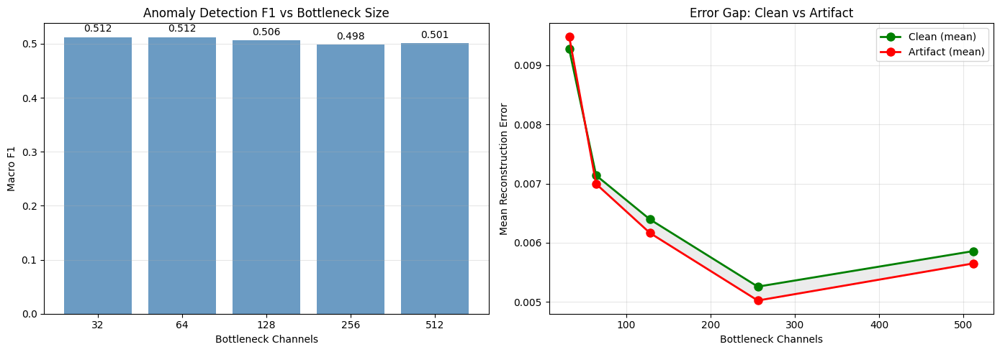

In [26]:
# Bottleneck comparison plots
fig = plot_bottleneck_comparison(bottleneck_results)
fig.savefig(f"{PLOTS_DIR}/bottleneck_comparison.png", dpi=150, bbox_inches="tight")
plt.show()

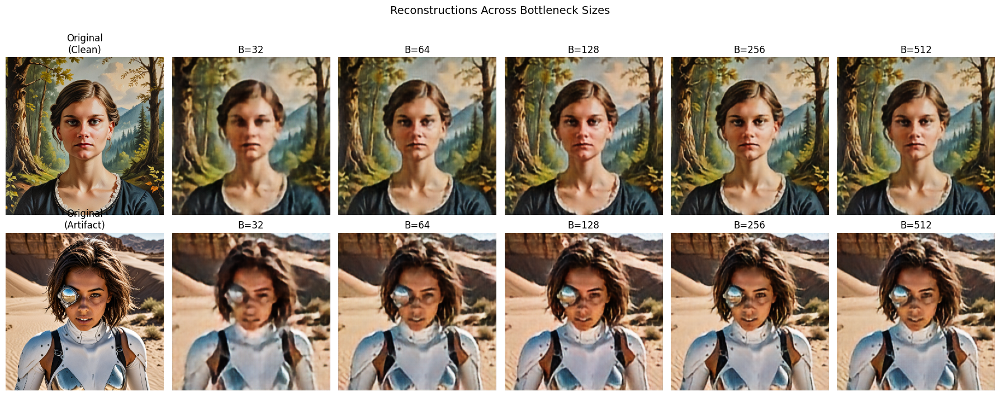

In [27]:
default_tr = bottleneck_results[DEFAULT_BOTTLENECK]['test_results']
clean_idx = np.where(default_tr['labels'] == 1)[0][0]
artifact_idx = np.where(default_tr['labels'] == 0)[0][0]

original_clean = default_tr['originals'][clean_idx]
original_artifact = default_tr['originals'][artifact_idx]

recon_clean = {}
recon_artifact = {}
for b in BOTTLENECK_CHANNELS_LIST:
    tr = bottleneck_results[b]['test_results']
    recon_clean[b] = tr['reconstructions'][clean_idx]
    recon_artifact[b] = tr['reconstructions'][artifact_idx]

fig = plot_bottleneck_reconstructions(
    bottleneck_results, original_clean, original_artifact, recon_clean, recon_artifact
)
fig.savefig(f"{PLOTS_DIR}/bottleneck_reconstructions.png", dpi=150, bbox_inches="tight")
plt.show()

### Bottleneck Size Analysis

**Findings:**

- **Small bottleneck (32):** Very aggressive compression (24x). Both clean and artifact images have high reconstruction error, making it difficult to distinguish between them. The model loses too much information about normal facial features.

- **Medium bottleneck (64-128):** The sweet spot for anomaly detection. The bottleneck is tight enough that artifact-specific patterns (which were never seen during training) cannot be faithfully reconstructed, but loose enough to accurately reconstruct normal facial features. This creates the largest gap between clean and artifact reconstruction errors.

- **Large bottleneck (256-512):** Minimal compression. The model has enough capacity to reconstruct almost anything, including artifacts. The error gap between clean and artifact images shrinks, reducing detection sensitivity.

**Key insight:** Anomaly detection with autoencoders relies on the information bottleneck. The bottleneck must be restrictive enough to force the model to learn only the "normal" data distribution, but not so restrictive that it cannot reconstruct normal data well.

## 10. Artifact Cleanup

Since the AE only knows how to reconstruct clean faces, its output is an "artifact-free" version of the input. The error map highlights where the artifact was.

Best bottleneck for anomaly detection: 32 (F1=0.5124)


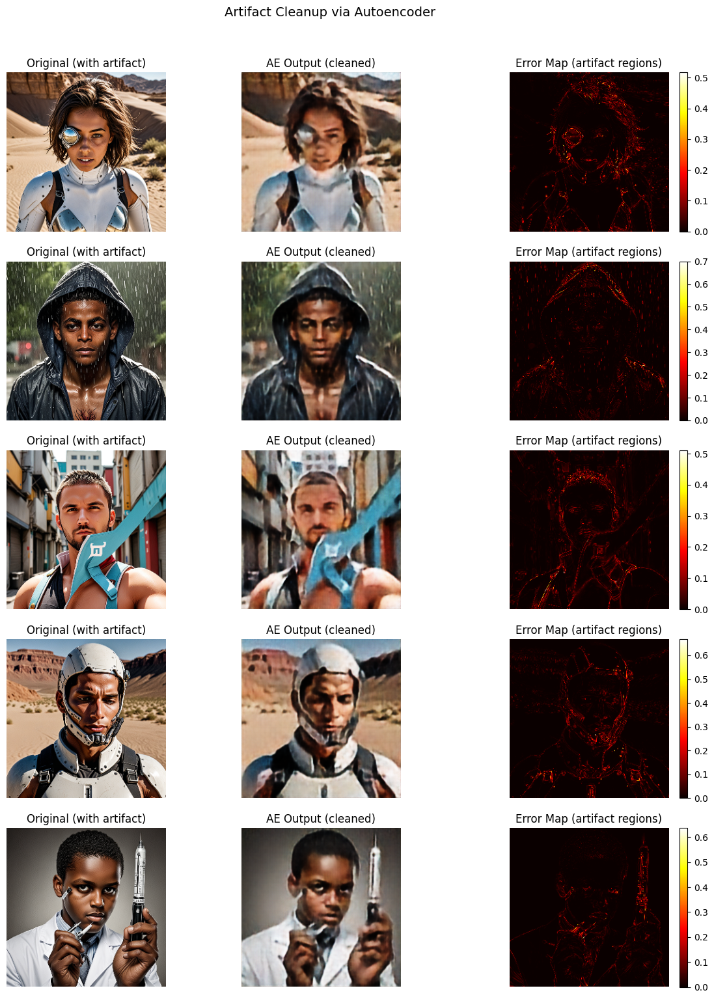

In [28]:
# Use the best bottleneck model for cleanup
best_b = max(bottleneck_results, key=lambda b: bottleneck_results[b]['macro_f1'])
print(f"Best bottleneck for anomaly detection: {best_b} (F1={bottleneck_results[best_b]['macro_f1']:.4f})")

best_tr = bottleneck_results[best_b]['test_results']

fig = plot_artifact_cleanup(
    best_tr['originals'],
    best_tr['reconstructions'],
    best_tr['error_maps'],
    best_tr['labels'],
    n_samples=5,
)
fig.savefig(f"{PLOTS_DIR}/artifact_cleanup.png", dpi=150, bbox_inches="tight")
plt.show()

**Cleanup observations:**
- The AE output appears "cleaner" -- artifact regions are reconstructed as the model's best guess of what a normal face should look like in that region.
- The error map (right column) clearly highlights artifact locations with bright regions.
- Note: This is not a perfect cleanup tool -- the AE reconstruction is blurry compared to the original due to the compression bottleneck. However, it effectively identifies and suppresses artifact regions.

## 11. [Advanced] Perceptual Loss

Replace pixel-wise MSE with a combined loss using VGG-16 feature matching. Perceptual loss captures structural and textural similarity rather than exact pixel values, which may improve anomaly detection for structural artifacts.

In [29]:
from perceptual import PerceptualLoss

set_seed(SEED)
perceptual_criterion = PerceptualLoss(alpha=PERCEPTUAL_WEIGHT).to(device)

model_perceptual, history_perceptual = train_autoencoder(
    bottleneck_channels=DEFAULT_BOTTLENECK,
    criterion=perceptual_criterion,
    num_epochs=NUM_EPOCHS,
    device=device,
    dataloaders=dataloaders,
)

torch.save(
    model_perceptual.state_dict(),
    f"{CHECKPOINT_DIR}/ae_perceptual_b{DEFAULT_BOTTLENECK}.pth",
)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /Users/lilianamirchuk/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [01:03<00:00, 8.70MB/s] 


Bottleneck=128, Parameters=1,972,163


Epoch 1/100 | Train Loss: 5.538790 | Val Loss: 5.619595 | LR: 1.00e-03


Epoch 2/100 | Train Loss: 5.385754 | Val Loss: 5.452552 | LR: 1.00e-03


Epoch 3/100 | Train Loss: 4.977754 | Val Loss: 5.063200 | LR: 1.00e-03


Epoch 4/100 | Train Loss: 4.526580 | Val Loss: 4.649753 | LR: 1.00e-03


Epoch 5/100 | Train Loss: 4.193786 | Val Loss: 4.289609 | LR: 1.00e-03


Epoch 6/100 | Train Loss: 3.920428 | Val Loss: 3.985263 | LR: 1.00e-03


Epoch 7/100 | Train Loss: 3.667216 | Val Loss: 3.789682 | LR: 1.00e-03


Epoch 8/100 | Train Loss: 3.484804 | Val Loss: 3.923475 | LR: 1.00e-03


Epoch 9/100 | Train Loss: 3.325340 | Val Loss: 3.508398 | LR: 1.00e-03


Epoch 10/100 | Train Loss: 3.180047 | Val Loss: 3.421933 | LR: 1.00e-03


Epoch 11/100 | Train Loss: 3.053334 | Val Loss: 3.322263 | LR: 1.00e-03


Epoch 12/100 | Train Loss: 2.966313 | Val Loss: 3.359756 | LR: 1.00e-03


Epoch 13/100 | Train Loss: 2.879383 | Val Loss: 3.226630 | LR: 1.00e-03


Epoch 14/100 | Train Loss: 2.801530 | Val Loss: 3.194973 | LR: 1.00e-03


Epoch 15/100 | Train Loss: 2.734899 | Val Loss: 3.125226 | LR: 1.00e-03


Epoch 16/100 | Train Loss: 2.668481 | Val Loss: 2.980455 | LR: 1.00e-03


Epoch 17/100 | Train Loss: 2.619011 | Val Loss: 2.879184 | LR: 1.00e-03


Epoch 18/100 | Train Loss: 2.561774 | Val Loss: 2.829476 | LR: 1.00e-03


Epoch 19/100 | Train Loss: 2.521266 | Val Loss: 2.813367 | LR: 1.00e-03


Epoch 20/100 | Train Loss: 2.481666 | Val Loss: 2.798543 | LR: 1.00e-03


Epoch 21/100 | Train Loss: 2.447692 | Val Loss: 2.869819 | LR: 1.00e-03


Epoch 22/100 | Train Loss: 2.415451 | Val Loss: 2.815724 | LR: 1.00e-03


Epoch 23/100 | Train Loss: 2.391005 | Val Loss: 2.727442 | LR: 1.00e-03


Epoch 24/100 | Train Loss: 2.361680 | Val Loss: 2.767125 | LR: 1.00e-03


Epoch 25/100 | Train Loss: 2.328888 | Val Loss: 2.758825 | LR: 1.00e-03


Epoch 26/100 | Train Loss: 2.306342 | Val Loss: 2.545908 | LR: 1.00e-03


Epoch 27/100 | Train Loss: 2.283587 | Val Loss: 2.512204 | LR: 1.00e-03


Epoch 28/100 | Train Loss: 2.255596 | Val Loss: 2.532872 | LR: 1.00e-03


Epoch 29/100 | Train Loss: 2.239404 | Val Loss: 2.549955 | LR: 1.00e-03


Epoch 30/100 | Train Loss: 2.223878 | Val Loss: 2.567690 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 2.214795 | Val Loss: 2.637071 | LR: 1.00e-03


Epoch 32/100 | Train Loss: 2.191969 | Val Loss: 2.458819 | LR: 1.00e-03


Epoch 33/100 | Train Loss: 2.164350 | Val Loss: 2.487856 | LR: 1.00e-03


Epoch 34/100 | Train Loss: 2.160691 | Val Loss: 2.422569 | LR: 1.00e-03


Epoch 35/100 | Train Loss: 2.136709 | Val Loss: 2.482059 | LR: 1.00e-03


Epoch 36/100 | Train Loss: 2.131852 | Val Loss: 2.419081 | LR: 1.00e-03


Epoch 37/100 | Train Loss: 2.123179 | Val Loss: 2.415021 | LR: 1.00e-03


Epoch 38/100 | Train Loss: 2.101168 | Val Loss: 2.322551 | LR: 1.00e-03


Epoch 39/100 | Train Loss: 2.082578 | Val Loss: 2.403972 | LR: 1.00e-03


Epoch 40/100 | Train Loss: 2.077349 | Val Loss: 2.369890 | LR: 1.00e-03


Epoch 41/100 | Train Loss: 2.059227 | Val Loss: 2.337606 | LR: 1.00e-03


Epoch 42/100 | Train Loss: 2.051639 | Val Loss: 2.322783 | LR: 1.00e-03


Epoch 43/100 | Train Loss: 2.045978 | Val Loss: 2.338157 | LR: 1.00e-03


Epoch 44/100 | Train Loss: 2.043015 | Val Loss: 2.289220 | LR: 1.00e-03


Epoch 45/100 | Train Loss: 2.023572 | Val Loss: 2.251646 | LR: 1.00e-03


Epoch 46/100 | Train Loss: 2.006544 | Val Loss: 2.213770 | LR: 1.00e-03


Epoch 47/100 | Train Loss: 2.006422 | Val Loss: 2.346010 | LR: 1.00e-03


Epoch 48/100 | Train Loss: 2.008609 | Val Loss: 2.336839 | LR: 1.00e-03


Epoch 49/100 | Train Loss: 1.997234 | Val Loss: 2.297307 | LR: 1.00e-03


Epoch 50/100 | Train Loss: 1.989993 | Val Loss: 2.350261 | LR: 1.00e-03


Epoch 51/100 | Train Loss: 1.984284 | Val Loss: 2.335268 | LR: 1.00e-03


Epoch 52/100 | Train Loss: 1.975052 | Val Loss: 2.262986 | LR: 1.00e-03


Epoch 53/100 | Train Loss: 1.926080 | Val Loss: 2.124626 | LR: 5.00e-04


Epoch 54/100 | Train Loss: 1.912046 | Val Loss: 2.167931 | LR: 5.00e-04


Epoch 55/100 | Train Loss: 1.909925 | Val Loss: 2.138071 | LR: 5.00e-04


Epoch 56/100 | Train Loss: 1.907090 | Val Loss: 2.121069 | LR: 5.00e-04


Epoch 57/100 | Train Loss: 1.905993 | Val Loss: 2.131863 | LR: 5.00e-04


Epoch 58/100 | Train Loss: 1.899664 | Val Loss: 2.150374 | LR: 5.00e-04


Epoch 59/100 | Train Loss: 1.894276 | Val Loss: 2.230996 | LR: 5.00e-04


Epoch 60/100 | Train Loss: 1.894047 | Val Loss: 2.110837 | LR: 5.00e-04


Epoch 61/100 | Train Loss: 1.887818 | Val Loss: 2.102255 | LR: 5.00e-04


Epoch 62/100 | Train Loss: 1.881176 | Val Loss: 2.231183 | LR: 5.00e-04


Epoch 63/100 | Train Loss: 1.887594 | Val Loss: 2.113713 | LR: 5.00e-04


Epoch 64/100 | Train Loss: 1.884877 | Val Loss: 2.167916 | LR: 5.00e-04


Epoch 65/100 | Train Loss: 1.876959 | Val Loss: 2.114850 | LR: 5.00e-04


Epoch 66/100 | Train Loss: 1.871114 | Val Loss: 2.099597 | LR: 5.00e-04


Epoch 67/100 | Train Loss: 1.869801 | Val Loss: 2.092350 | LR: 5.00e-04


Epoch 68/100 | Train Loss: 1.869721 | Val Loss: 2.124542 | LR: 5.00e-04


Epoch 69/100 | Train Loss: 1.861673 | Val Loss: 2.088362 | LR: 5.00e-04


Epoch 70/100 | Train Loss: 1.855826 | Val Loss: 2.086980 | LR: 5.00e-04


Epoch 71/100 | Train Loss: 1.858126 | Val Loss: 2.061737 | LR: 5.00e-04


Epoch 72/100 | Train Loss: 1.853306 | Val Loss: 2.082401 | LR: 5.00e-04


Epoch 73/100 | Train Loss: 1.851023 | Val Loss: 2.092116 | LR: 5.00e-04


Epoch 74/100 | Train Loss: 1.844835 | Val Loss: 2.107602 | LR: 5.00e-04


Epoch 75/100 | Train Loss: 1.852798 | Val Loss: 2.104791 | LR: 5.00e-04


Epoch 76/100 | Train Loss: 1.844054 | Val Loss: 2.116383 | LR: 5.00e-04


Epoch 77/100 | Train Loss: 1.842307 | Val Loss: 2.223087 | LR: 5.00e-04


Epoch 78/100 | Train Loss: 1.816280 | Val Loss: 2.011546 | LR: 2.50e-04


Epoch 79/100 | Train Loss: 1.813643 | Val Loss: 2.017821 | LR: 2.50e-04


Epoch 80/100 | Train Loss: 1.810808 | Val Loss: 2.008551 | LR: 2.50e-04


Epoch 81/100 | Train Loss: 1.807054 | Val Loss: 2.015251 | LR: 2.50e-04


Epoch 82/100 | Train Loss: 1.804537 | Val Loss: 2.053916 | LR: 2.50e-04


Epoch 83/100 | Train Loss: 1.803299 | Val Loss: 1.999872 | LR: 2.50e-04


Epoch 84/100 | Train Loss: 1.802152 | Val Loss: 2.007315 | LR: 2.50e-04


Epoch 85/100 | Train Loss: 1.797668 | Val Loss: 2.037570 | LR: 2.50e-04


Epoch 86/100 | Train Loss: 1.806913 | Val Loss: 2.036998 | LR: 2.50e-04


Epoch 87/100 | Train Loss: 1.803346 | Val Loss: 2.012553 | LR: 2.50e-04


Epoch 88/100 | Train Loss: 1.800623 | Val Loss: 2.028336 | LR: 2.50e-04


Epoch 89/100 | Train Loss: 1.794640 | Val Loss: 2.015164 | LR: 2.50e-04


Epoch 90/100 | Train Loss: 1.784513 | Val Loss: 1.980212 | LR: 1.25e-04


Epoch 91/100 | Train Loss: 1.780672 | Val Loss: 1.970696 | LR: 1.25e-04


Epoch 92/100 | Train Loss: 1.781536 | Val Loss: 1.973721 | LR: 1.25e-04


Epoch 93/100 | Train Loss: 1.781070 | Val Loss: 1.971213 | LR: 1.25e-04


Epoch 94/100 | Train Loss: 1.781676 | Val Loss: 1.974956 | LR: 1.25e-04


Epoch 95/100 | Train Loss: 1.776957 | Val Loss: 1.981662 | LR: 1.25e-04


Epoch 96/100 | Train Loss: 1.775455 | Val Loss: 1.970534 | LR: 1.25e-04


Epoch 97/100 | Train Loss: 1.776719 | Val Loss: 1.978264 | LR: 1.25e-04


Epoch 98/100 | Train Loss: 1.764264 | Val Loss: 1.962581 | LR: 6.25e-05


Epoch 99/100 | Train Loss: 1.764912 | Val Loss: 1.960069 | LR: 6.25e-05


Epoch 100/100 | Train Loss: 1.764652 | Val Loss: 1.958494 | LR: 6.25e-05
Saved checkpoint: /Users/lilianamirchuk/Desktop/it_jim_genai_course/lab_2/outputs/checkpoints/ae_bottleneck_128.pth


In [ ]:
# evaluate perceptual model (use MSE for anomaly scoring, not perceptual loss)
perceptual_test = compute_reconstruction_errors(model_perceptual, dataloaders['test'], device)
perceptual_val = compute_reconstruction_errors(model_perceptual, dataloaders['val'], device)

perceptual_threshold = set_threshold_from_clean(perceptual_val['errors'], percentile=95)
perceptual_eval = evaluate_anomaly_detection(
    perceptual_test['errors'], perceptual_test['labels'], perceptual_threshold
)

print(f"\nPerceptual Loss Results (B={DEFAULT_BOTTLENECK})")
print(f"Macro F1:  {perceptual_eval['macro_f1']:.4f}")
print(perceptual_eval['report'])

# Compare with MSE-only
mse_f1 = bottleneck_results[DEFAULT_BOTTLENECK]['macro_f1']
print(f"\nComparison (B={DEFAULT_BOTTLENECK}):")
print(f"  MSE Loss:        Macro F1 = {mse_f1:.4f}")
print(f"  Perceptual Loss: Macro F1 = {perceptual_eval['macro_f1']:.4f}")

Computing errors: 100%|██████████| 16/16 [00:06<00:00,  2.66it/s]


Perceptual Loss Results (B=128)
Macro F1:  0.5475
              precision    recall  f1-score   support

    artifact       0.33      0.10      0.15        20
       clean       0.91      0.98      0.94       180

    accuracy                           0.89       200
   macro avg       0.62      0.54      0.55       200
weighted avg       0.85      0.89      0.86       200


Comparison (B=128):
  MSE Loss:        Macro F1 = 0.5064
  Perceptual Loss: Macro F1 = 0.5475


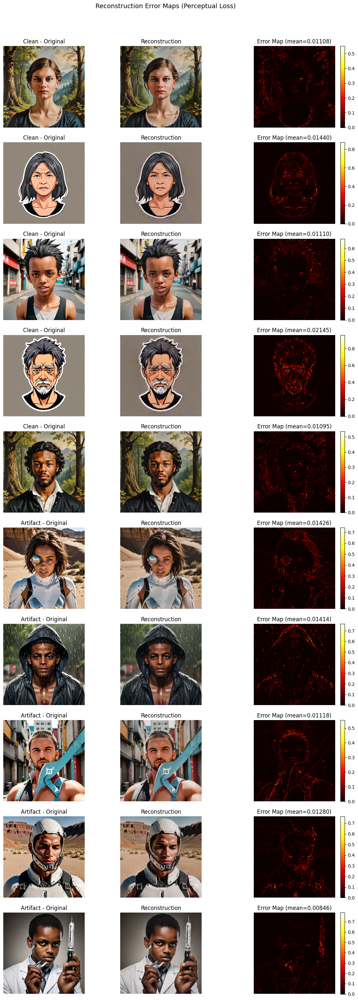

In [31]:
fig = plot_error_maps(
    perceptual_test['originals'],
    perceptual_test['reconstructions'],
    perceptual_test['error_maps'],
    perceptual_test['labels'],
    n_samples=5,
    title="Reconstruction Error Maps (Perceptual Loss)",
)
fig.savefig(f"{PLOTS_DIR}/error_maps_perceptual.png", dpi=150, bbox_inches="tight")
plt.show()

In [5]:
from models import ConvAutoencoder
from evaluate import compute_reconstruction_errors
from dataset import get_ae_dataloaders
from config import IMG_SIZE, BATCH_SIZE, DEFAULT_BOTTLENECK, CHECKPOINT_DIR

model = ConvAutoencoder(bottleneck_channels=DEFAULT_BOTTLENECK).to(device)
model.load_state_dict(torch.load(
    f"{CHECKPOINT_DIR}/ae_bottleneck_{DEFAULT_BOTTLENECK}.pth",
    map_location=device, weights_only=True
))
model.eval()

dataloaders = get_ae_dataloaders(img_size=IMG_SIZE, batch_size=BATCH_SIZE)
test_results = compute_reconstruction_errors(model, dataloaders['test'], device)
print(f"Loaded model (B={DEFAULT_BOTTLENECK}), computed test errors for {len(test_results['errors'])} images.")


Computing errors: 100%|██████████| 13/13 [00:05<00:00,  2.51it/s]

Loaded model (B=128), computed test errors for 200 images.


## 12. [Advanced] Ensemble: AE + Lab 1 Classifier

Combine the AE anomaly score (reconstruction error) with the Lab 1 ViT classifier's artifact probability for a stronger detector.

Bottleneck experiments not run yet -- using default model test_results.

Ensemble (AE weight=0.5):
  Macro F1: 0.8071
  ROC-AUC: 0.8586
  Threshold: 0.502924


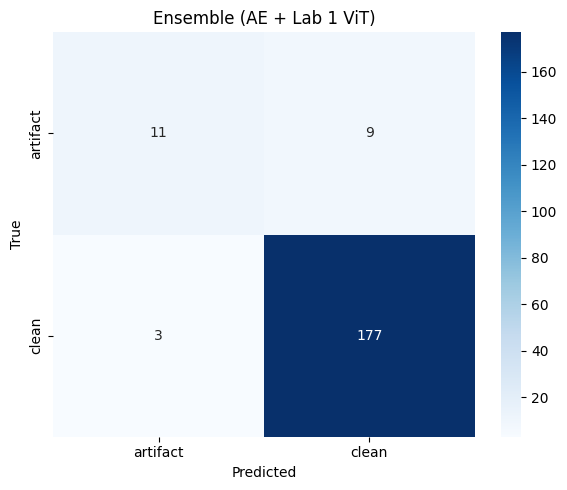

In [6]:
from ensemble import run_ensemble

# Use bottleneck experiment results if available, otherwise fall back to default model
if "bottleneck_results" in dir() and best_b in bottleneck_results:
    best_test = bottleneck_results[best_b]["test_results"]
else:
    print("Bottleneck experiments not run yet -- using default model test_results.")
    best_test = test_results  # from section 7 (default AE, bottleneck=128)

try:
    ensemble_results = run_ensemble(
        ae_errors=best_test["errors"],
        ae_labels=best_test["labels"],
        ae_weight=ENSEMBLE_AE_WEIGHT,
        device=device,
    )

    # Confusion matrix
    fig = plot_confusion_matrix(
        ensemble_results["confusion_matrix"],
        title="Ensemble (AE + Lab 1 ViT)",
    )
    fig.savefig(f"{PLOTS_DIR}/confusion_matrix_ensemble.png", dpi=150, bbox_inches="tight")
    plt.show()

except FileNotFoundError as e:
    print(f"Skipping ensemble: {e}")
    print("(Lab 1 checkpoint not found. Run Lab 1 training first.)")
